In [2]:
import torch, sys, os; sys.path.append(os.getcwd())
from submodules.depth_anything_v2.dpt import DepthAnythingV2
import cv2, json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import open3d as o3d
from dataset.wildtrack import Wildtrack
from sklearn.cluster import DBSCAN

def cluster_and_find_center(points, eps=5, min_samples=10):
    
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(points)
    
    labels = clustering.labels_
    core_samples_mask = np.zeros_like(labels, dtype=bool)
    core_samples_mask[clustering.core_sample_indices_] = True
    
    unique_labels = set(labels)
    max_cluster_label = max(unique_labels, key=lambda x: sum(labels == x) if x != -1 else -1)
    if max_cluster_label == -1:
        return None, None

    cleaned_points = points[labels == max_cluster_label]
    
    center = np.mean(cleaned_points, axis=0)
    
    return cleaned_points, center

def depth_filter(depth, ratio=0.5, max_depth=30):
    if not isinstance(depth, np.ndarray):
        depth = np.array(depth)
        
    # Calculate the horizontal and vertical gradients
    grad_x = np.abs(depth[:, 1:] - depth[:, :-1])  # Horizontal gradient
    grad_y = np.abs(depth[1:, :] - depth[:-1, :])  # Vertical gradient

    # Pad the gradients to maintain the same size as the input depth map
    grad_x = np.pad(grad_x, ((0, 0), (0, 1)), mode='constant', constant_values=0)  # Pad last column
    grad_y = np.pad(grad_y, ((0, 1), (0, 0)), mode='constant', constant_values=0)  # Pad last row

    # Combine the gradients (you can also use the maximum or another metric)
    grad_magnitude = grad_x + grad_y

    # Create the mask: True for regions with gradient < threshold, False otherwise
    if ratio is not None:
        threshold = np.mean(grad_magnitude) * ratio
        mask = grad_magnitude < threshold
    else:
        mask = np.ones_like(grad_magnitude, dtype=bool)
        
    # Apply max_depth constraint
    if max_depth is not None:
        mask = np.logical_and(mask, depth < max_depth)

    return mask

def m2cm(x):
    return x * 100

def projection(depth, w2c, K, width, height, image, mask):
    valid_mask  = depth_filter(depth, ratio=0.2, max_depth=30)
    depth = np.where(valid_mask, depth, 0)
    depth = m2cm(depth)
    mask_comb = np.where(mask>0, np.ones_like(mask), np.zeros_like(mask))
    mask_comb = cv2.resize(mask_comb, (width, height))
    mask = cv2.resize(mask, (width, height))

    v, u = np.where(mask_comb)
    hum_idx = mask[v, u]
    v = v[hum_idx>0]
    u = u[hum_idx>0]
    hum_idx = hum_idx[hum_idx>0]
    c2w = np.linalg.inv(w2c)
    x = (u - K[0, 2]) / K[0, 0] * depth[v, u]
    y = (v - K[1, 2]) / K[1, 1] * depth[v, u]
    z = depth[v, u]
    points = np.stack([x, y, z], axis=1)
    points = c2w[:3, :3] @ points.T + c2w[:3, 3:]
    image = cv2.resize(image, (width, height))
    rgbs = image[v, u]
    rgbs = rgbs[z>0]
    points = points.T[z>0]
    hum_idx = hum_idx[z>0]
    return points, rgbs, hum_idx

tar_cam_idx = 0
path1 = f'/home/jiahao/3DReconstruction/mvdet/IterativeMatchingLabel/CVPR2025/label_sup/00000000_mask/cam{tar_cam_idx+1}.npy'
mask1 = np.load(path1)

width, height = 960, 540
delete_humID = [54, 51, 53, 13, 17, 16, 29, 28, 40, 36]
uncompleted_mask1 = np.zeros_like(mask1)
for humID in np.unique(mask1):
    if humID in delete_humID:
        continue
    mask = mask1 == humID
    uncompleted_mask1[mask] = humID
uncompleted_mask1 = np.where(uncompleted_mask1>0, np.ones_like(uncompleted_mask1), np.zeros_like(uncompleted_mask1))    
uncompleted_mask1 = cv2.resize(uncompleted_mask1, (width, height))
model_configs = {
        'vits': {'encoder': 'vits', 'features': 64,  'out_channels': [48, 96, 192, 384]},
        'vitb': {'encoder': 'vitb', 'features': 128, 'out_channels': [96, 192, 384, 768]},
        'vitl': {'encoder': 'vitl', 'features': 256, 'out_channels': [256, 512, 1024, 1024]},
        'vitg': {'encoder': 'vitg', 'features': 384, 'out_channels': [1536, 1536, 1536, 1536]}
    }
max_depth = 40
encoder = 'vits'
ckpt_path = 'output/final_wt_full_training_data/latest.pth'
model = DepthAnythingV2(**{**model_configs[encoder], 'max_depth': max_depth})
model.load_state_dict(torch.load(ckpt_path, map_location='cpu', weights_only=True)['model'])
model.cuda()
model.eval()


image1_path = f'CVPR2025/label_sup/00000000_imgs/cam{tar_cam_idx+1}.png'
image1 = cv2.imread(image1_path)
depth1 = model.infer_image(image1)
depth1 = cv2.resize(depth1, (width, height))
image1 = cv2.resize(image1, (width, height))
depth1 = m2cm(depth1)



data_root = r'/home/jiahao/Downloads/data/wildtrack_data'
wildtrack_data = Wildtrack(data_root, mask_type='people', mask_label_type='split', start_with=0, end_with=-1)
Ks = wildtrack_data.intrinsic_matrices
w2cs = wildtrack_data.w2cs

mask_img = np.stack([uncompleted_mask1, uncompleted_mask1, uncompleted_mask1], axis=-1)
mask_img = mask_img * 255
mask_img = mask_img.astype(np.uint8)
mask_img = cv2.addWeighted(image1, 0.7, mask_img, 0.3, 0)
mask_img_ori = mask_img.copy()

sam_points = []
sam_bboxes = []
for sup_cam_idx in range(7):
    if sup_cam_idx == tar_cam_idx:
        continue
    path2 = f'/home/jiahao/3DReconstruction/mvdet/IterativeMatchingLabel/CVPR2025/label_sup/00000000_mask/cam{sup_cam_idx+1}.npy'
    mask2 = np.load(path2)

    image2_path = f'CVPR2025/label_sup/00000000_imgs/cam{sup_cam_idx+1}.png'
    image2 = cv2.imread(image2_path)
    depth2 = model.infer_image(image2)
    depth2 = cv2.resize(depth2, (width, height))

    points2, rgbs2, hum_idx2 = projection(depth2, w2cs[sup_cam_idx], Ks[sup_cam_idx], width, height, image2, mask2)   


    w2c1 = w2cs[tar_cam_idx]
    K1 = Ks[tar_cam_idx]
    points_c1 = w2c1[:3, :3] @ points2.T + w2c1[:3, 3:] # [3, N]
    d1 = points_c1[2]
    points_s1 = K1 @ points_c1
    points_s1 = points_s1 / points_s1[2]
    canvas = np.zeros_like(depth1)
    valid_mask = (points_s1[0] > 0) & (points_s1[0] < width) & (points_s1[1] > 0) & (points_s1[1] < height)

    hum_idx2 = hum_idx2[valid_mask]
    points_s1 = points_s1[:, valid_mask]
    # fig, ax = plt.subplots(figsize=(30, 10))
    random_colors = np.random.rand(np.max(hum_idx2), 3) 
    for idx in np.unique(hum_idx2):

        mask = hum_idx2 == idx
        clean_points, _ = cluster_and_find_center(points_s1[:2, mask].T)
        if clean_points is None:
            continue
        if len(clean_points) < 500:
            continue
        v = clean_points[:, 1].astype(int)
        u = clean_points[:, 0].astype(int)
        with_mask_pts = uncompleted_mask1[v, u]
        if np.sum(with_mask_pts) / len(with_mask_pts) > 0.7:
            continue 
        v = v[with_mask_pts==0]
        u = u[with_mask_pts==0]
        mask_img[v, u] = [255, 0, 0]
        left_top = (np.min(u), np.min(v))
        bbox_width = np.max(u) - left_top[0]
        bbox_height = np.max(v) - left_top[1]
       
        # rect = patches.Rectangle(left_top, bbox_width, bbox_height, linewidth=1, edgecolor=random_colors[idx-1], facecolor='none')
        # ax.add_patch(rect)
        
        sam_points.append(np.stack([u, v], axis=1))
        sam_bboxes.append(np.array([left_top[0], left_top[1], bbox_width, bbox_height]))
        
    # plt.imshow(mask_img[...,::-1])
    # plt.show()
    
plt.figure(figsize=(40, 20))    
plt.imshow(mask_img_ori[...,::-1])
for i, bbox in enumerate(sam_bboxes):
    plt.gca().add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=3, edgecolor='b', facecolor='none'))
    uv = sam_points[i]
    # randomly select 10 points to show
    idx = np.random.choice(len(uv), 50)
    uv = uv[idx]
    plt.scatter(uv[:, 0], uv[:, 1], c='g', s=15)
# plt.show()
plt.axis('off')
plt.savefig('CVPR2025/label_sup/before_sup_1.png', dpi=300, bbox_inches='tight', pad_inches=0)
plt.close()



In [2]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "submodules/Grounded-Segment-Anything/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

/home/jiahao/3DReconstruction/mvdet/IterativeMatchingLabel/submodules/Grounded-Segment-Anything/segment_anything/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exp

In [3]:
sam_bboxes_filtered = []
sam_points_filtered = []
sam_points_label = []
for i, (bbox, points) in enumerate(zip(sam_bboxes, sam_points)):
    x1, y1, w, h = bbox
    # if w > h:
    #     continue
    x2, y2 = x1 + w, y1 + h
    sam_bboxes_filtered.append([x1, y1, x2, y2])
    sam_points_filtered.append(points)
    sam_points_label.append(np.ones(len(points)) * i)
    
sam_bboxes_filtered = np.array(sam_bboxes_filtered)
print("Box shape:", sam_bboxes_filtered.shape)  
print("Box content:", sam_bboxes_filtered)  
print("Points shape:", len(sam_points_filtered))
print("Points label shape:", len(sam_points_filtered))

Box shape: (13, 4)
Box content: [[697  59 711  91]
 [825  74 844 149]
 [670  67 686 111]
 [825  82 856 142]
 [591  64 608 119]
 [693  60 701  75]
 [828  73 855 115]
 [738  71 812  89]
 [709  98 756 132]
 [552  89 589 176]
 [499  91 534 185]
 [462  71 479 157]
 [564  94 589 182]]
Points shape: 13
Points label shape: 13


In [4]:

predictor.set_image(image1[..., ::-1])
sup_masks = []
max_points_per_bbox = 20
for bidx, bbox in enumerate(sam_bboxes_filtered):
    if len(sam_points_filtered[bidx]) > max_points_per_bbox:
        # Randomly sample points
        idx = np.random.choice(len(sam_points_filtered[bidx]), max_points_per_bbox, replace=False)
        pcoord = sam_points_filtered[bidx][idx]
        plabel = sam_points_label[bidx][idx]
        
    masks, _, _ = predictor.predict(
        point_coords=pcoord,
        point_labels=plabel,
        # box=bbox.reshape(1, 4),
        multimask_output=False,
    )
    sup_masks.append(masks[0])



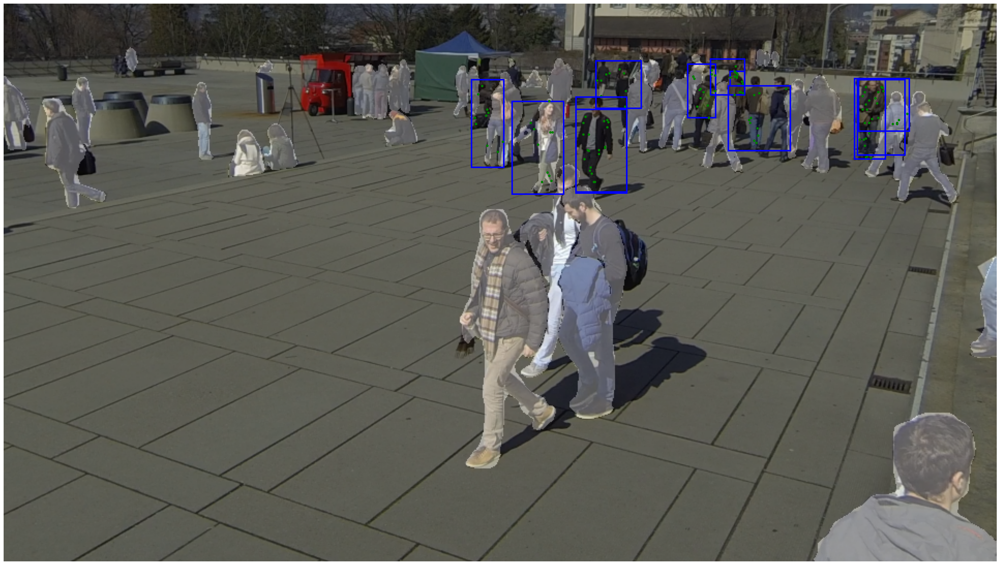

In [5]:
refine_sam_points = []
refine_sam_bboxes = []  
max_points_per_bbox = 10
for mask in sup_masks:
    v, u = np.where(mask)
    x1 = np.min(u)
    y1 = np.min(v)
    x2 = np.max(u)  
    y2 = np.max(v)
    w = x2 - x1
    h = y2 - y1
    if w > h:
        continue
    # randomly select 20 points 
    idx = np.random.choice(len(v), max_points_per_bbox, replace=False)
    v = v[idx]
    u = u[idx]
    refine_sam_points.append(np.stack([u, v], axis=1))
    refine_sam_bboxes.append(np.array([x1, y1, x2, y2]))

plt.figure(figsize=(40, 20))
plt.imshow(mask_img_ori[...,::-1])
for i, bbox in enumerate(refine_sam_bboxes):
    plt.gca().add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1], linewidth=3, edgecolor='b', facecolor='none'))
    uv = refine_sam_points[i]
    plt.scatter(uv[:, 0], uv[:, 1], c='g', s=15)
plt.axis('off')
plt.savefig('CVPR2025/label_sup/sam_pcs_bbox.png', bbox_inches='tight', pad_inches=0, dpi=300)

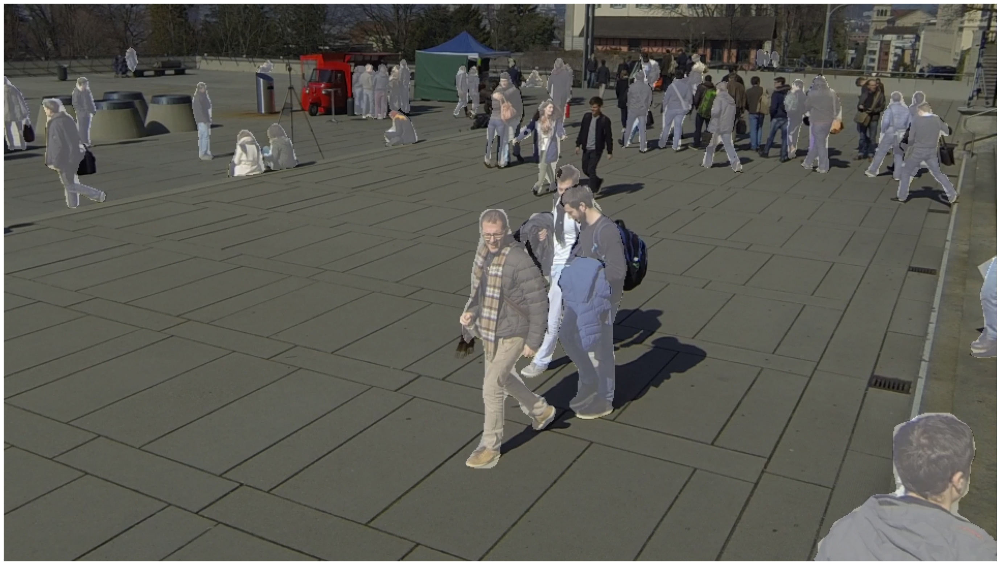

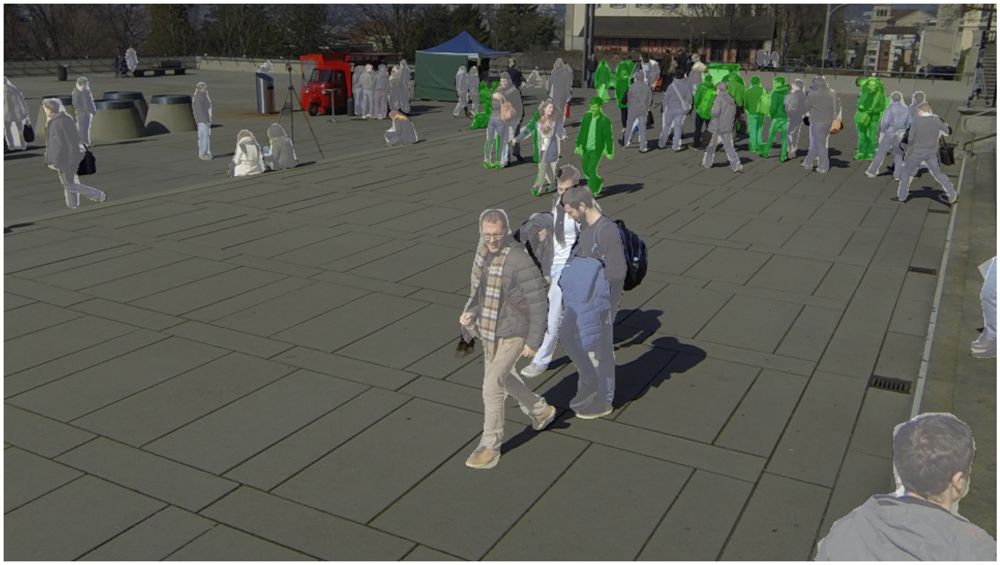

In [6]:
sup_masks = []
for bidx, bbox in enumerate(refine_sam_bboxes):
    masks, _, _ = predictor.predict(
        point_coords=refine_sam_points[bidx],
        point_labels=np.ones(len(refine_sam_points[bidx])),
        box=bbox.reshape(1, 4),
        multimask_output=False,
    )
    sup_masks.append(masks[0])
    
sup_masks = np.array(sup_masks)
# combine the masks
sup_masks_comb = np.any(sup_masks, axis=0)
colored_mask = np.zeros((sup_masks_comb.shape[0], sup_masks_comb.shape[1], 3))
colored_mask[sup_masks_comb] = [0, 255, 0]
colored_mask[uncompleted_mask1.astype(np.bool_)] = [255, 255, 255]

sup_mask_img = cv2.addWeighted(image1, 0.7, colored_mask.astype(np.uint8), 0.3, 0)

plt.figure(figsize=(40, 20))
plt.imshow(mask_img_ori[...,::-1])
plt.axis('off')
plt.savefig('CVPR2025/label_sup/before_sup.png', bbox_inches='tight', pad_inches=0, dpi=300)

plt.figure(figsize=(40, 20))
plt.imshow(sup_mask_img[...,::-1])
plt.axis('off')
plt.savefig('CVPR2025/label_sup/after_sup.png', bbox_inches='tight', pad_inches=0, dpi=300)

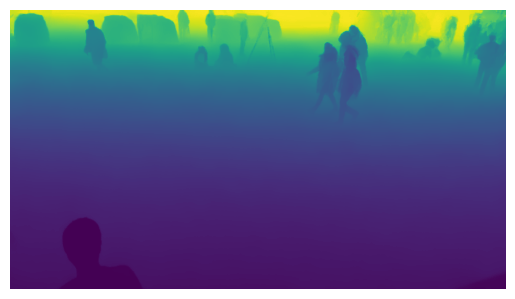

In [11]:
depths = np.load('submodules/Marigold/data/wildtrack/00000000/depths_marigold.npy')
for i, depth in enumerate(depths):
    plt.imshow(depth)
    plt.axis('off')
    plt.savefig('CVPR2025/label_sup/depth_figures/depth_{}.png'.format(i), bbox_inches='tight', pad_inches=0, dpi=300)